In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import ncvis
import pickle
import os

## For debugging purposes, not used by default
## Allows to capture stdout output in Juputer Notebook
## Useful to track subrocess logs
%load_ext wurlitzer

data_dir = "big-data"
img_dir  = "img"

# Preparing Data

## Loading India News Dataset

We will use [News Headlines Of India](https://www.kaggle.com/therohk/india-headlines-news-dataset) dataset as it provides more than 2 millions samples for analysis. This setting will keep us closer to the tasks emerging in real world.

In [7]:
file_name = "india-news-headlines.csv"
data_path = os.path.join(data_dir, file_name)

In [4]:
!mkdir -p $data_dir
!kaggle datasets download -f $file_name -p $data_dir therohk/india-headlines-news-dataset
!unzip -d $data_dir -u $data_path".zip"

india-news-headlines.csv.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  big-data/india-news-headlines.csv.zip


Text preprocessing functions:

## Preprocessing

In [5]:
import unicodedata
import re
# Turn a Unicode string to plain ASCII, thanks to
# http://stackoverflow.com/a/518232/2809427
def unicode_to_ascii(s):
    return "".join(
        c for c in unicodedata.normalize("NFD", s)
        if unicodedata.category(c) != "Mn"
    )

# Lowercase, trim, and remove non-letter characters
def normalize_string(s):
    s = unicode_to_ascii(s.lower().strip())
    s = re.sub(r"[^a-zA-Z.!?,()]+", r" ", s)
    return s.strip()

Prepare the dataset:
1. Drop samples with *\"unknown\"* category;
2. Sort categories by frequency and take only leading of them;
3. Preprocess each sample's *headline_text*;
4. Reset the index to make sure there are no skipped numbers.

In [6]:
n_top = 50

df = pd.read_csv(data_path)
df = df[df.headline_category != "unknown"]
df.publish_date = pd.to_datetime(df.publish_date, format="%Y%m%d")
print("Total number of headers:", len(df.index))
top_cat = df.headline_category.value_counts()[:n_top].index.values
df = df[df.headline_category.isin(top_cat)]
print("Top-{} number of headers: {}".format(n_top, len(df.index)))
# df = df.sample(n=n_news, random_state=42).reset_index(drop=True)
# print("Selected number of headers:", len(df.index))
df.headline_category = df.headline_category.astype("category")
df.drop(columns="publish_date", inplace=True)
df.headline_text = df.headline_text.apply(normalize_string)
df = df[df.headline_text != ""].reset_index(drop=True)

Total number of headers: 2763429
Top-50 number of headers: 2230807


In [7]:
print("Most popular topics:")
print(df.headline_category.value_counts())

Most popular topics:
india                                   270958
city.mumbai                             122990
city.delhi                              112651
business.india-business                 107523
city.chandigarh                          99688
city.hyderabad                           86201
city.bengaluru                           84463
entertainment.hindi.bollywood.news       80086
city.lucknow                             77865
city.ahmedabad                           77514
city.pune                                75852
city.kolkata                             73180
city.nagpur                              70099
city.goa                                 68206
city.chennai                             63856
city.patna                               63308
city.jaipur                              45752
sports.icc-world-cup-2015                40056
business.international-business          36083
city.gurgaon                             27950
city.bhubaneswar                       

There are too many topics starting with _\"city.\*\"_, it seems reasonable to collapse them in one.

In [8]:
import re
def collapse(string, pattern, replacement):
    if re.match(pattern, string):
        return replacement
    else:
        return string
    
collapse_city = lambda x: collapse(x, r"city\..*", "india.city") 

df.headline_category = df.headline_category.apply(collapse_city)
# Replacement has changed the column's type
df.headline_category = df.headline_category.astype("category")

In [9]:
print("Changed most popular topics:")
print(df.headline_category.value_counts())

Changed most popular topics:
india.city                              1516255
india                                    270958
business.india-business                  107523
entertainment.hindi.bollywood.news        80086
sports.icc-world-cup-2015                 40056
business.international-business           36083
tv.news.hindi                             25788
entertainment.english.hollywood.news      24546
tech.tech-news                            18977
sports.football                           18327
home.education                            17827
world.us                                  17233
citizen-reporter.stories                  15351
entertainment.tamil.movies.news           14584
news                                      13970
world.rest-of-world                       13241
Name: headline_category, dtype: int64


# Getting the Headers' Representations

## Word Vectors by fastText

These words vectors are provided by [fastText](https://fasttext.cc/docs/en/english-vectors.html). There are 1M of them, which is enough for basic analysis.

In [10]:
file_name = "wiki-news-300d-1M.vec"
!wget -nc -P $data_dir https://dl.fbaipublicfiles.com/fasttext/vectors-english/$file_name".zip"
data_path = os.path.join(data_dir, file_name)
!unzip -d $data_dir -u $data_path".zip"

File ‘big-data/wiki-news-300d-1M.vec.zip’ already there; not retrieving.

Archive:  big-data/wiki-news-300d-1M.vec.zip


In [11]:
def seq2ind(seq, word2index):
    return [word2index[w] for w in seq]
  
def seq2words(ind_seq, index2word):
    return [index2word[x] for x in ind_seq]

def words2sent(words):
    return " ".join([w for w in words])

def ind2sent(ind_seq, index2word):
    return words2sent(seq2words(ind_seq, index2word))

In [12]:
import time
def load_vec(emb_path, max_words=-1):
    vectors = []
    word2id = {}
    it = 0
    with open(emb_path) as f:
        nvec, ndim = [int(k) for k in f.readline().split()]
        print('Number of vectors:', nvec)
        print('Number of dimensions:', ndim)
        ping = time.time()
        nread = 0
        for line in f:
            nread += 1
            if max_words != -1 and it > max_words:
                break
            it += 1
            orig_word, vect = line.rstrip().split(" ", 1)
            
            word = normalize_string(orig_word)
            vect = np.fromstring(vect, sep=" ")
       
            # Words are sorted by frequency, no need to add less 
            # frequent version of the same word  
            if not (word in word2id):
                vectors.append(vect)
                word2id[word] = len(word2id)
            
            pong = time.time()
            if pong-ping > 5:
                ping = time.time()
                print("Read: {:.2f}%".format(nread/nvec*100))
  
    id2word = {v: k for k, v in word2id.items()}
    embeddings = np.vstack(vectors)
    return embeddings, id2word, word2id

## Custom Encoder

We propose to encode each sentence as a mean of its words. In case we meet a word that was not present in *fastText* embeddings, we just set its embedding to zero vector.

In [13]:
class Aggregator:
    """Builds sentence representation given words encodings. 
    """
    def __init__(self, path, max_words=-1):
        """
        Arguments: 
        path      -- path to file with embeddings (str)
        max_words -- maximum number of embeddings to load (sorted by frequency)
        """   
        self.emb = {}
        self.id2word = {}
        self.word2id = {}
        self.emb, self.id2word, self.word2id = load_vec(path, max_words)
        self.dim = self.emb.shape[1]
            
        self.cache = {}
        
    def embed_word(self, word):
        if word in self.cache:
            return self.cache[word]
        else:
            # Handle unknown
            if word in self.word2id:
                vec = self.emb[self.word2id[word]]
                self.cache[word] = vec
            else:
                vec = np.zeros(self.dim)
            return vec
    
    def embed_sent(self, sent):
        return self.embed_seq(sent.split())
    
    def embed_seq(self, seq):
        enc = np.array([self.embed_word(w) for w in seq])
        return np.mean(enc, axis=0)

The *Aggregator* takes some time to be built, so we pickle and load it to avoid repetetive reconstruction.

In [14]:
agg_path = os.path.join(data_dir, "aggregator")
try:
    with open(agg_path, 'rb') as f:
        agg = pickle.load(f)
    print("Successfully loaded")
except:
    print("Constructing new")
    agg = Aggregator(data_path, max_words=-1)
    with open(agg_path, 'wb') as f:
        pickle.dump(agg, f)

Successfully loaded


## Constructing Sentences Representation

The only thing left is to apply the aggregator to each headline text. This is, again, time consuming process, so we pickle the results.

In [257]:
vec_path = os.path.join(data_dir, "news_vectors")
try:
    df = pd.read_pickle(vec_path)
    print("Successfully loaded")
except:
    print("Constructing new")
    df['vector'] = df.headline_text.apply(agg.embed_sent)
    df.to_pickle(vec_path)

Successfully loaded


In [258]:
df.head()

,headline_category,headline_text,vector
0,entertainment.hindi.bollywood.news,devdas jinxed?,"[-0.0649, -0.0419, -0.06535, -0.0679, -0.1091,..."
1,business.india-business,car dealers caught in bihar sales tax ruling,"[-0.0211125, -0.038599999999999995, -0.049475,..."
2,india.city,he s not so inscrutable,"[0.027379999999999998, -0.05566, -0.0492800000..."
3,india.city,three in race for chief secy s post,"[0.0060374999999999995, -0.021500000000000005,..."
4,india.city,dpcc stages nyay rally,"[0.032549999999999996, -0.05925, -0.056075, -0..."


# Visualizing the Representations

## Using NCVis

Get vector representations of the headlines and apply NCVis. We are using **cosine** distance as *fastText* representations for similar words have greater scalar product than for dissimilar ones.   

In [13]:
X = np.stack(df.vector.values)
y = df.headline_category.cat.codes.values
names = dict(enumerate(df.headline_category.cat.categories))

In [19]:
import ncvis
vis = ncvis.NCVis(distance='cosine')

In [20]:
%%time
Ys = vis.fit_transform(X)

CPU times: user 2h 27min 27s, sys: 11.4 s, total: 2h 27min 38s
Wall time: 12min 31s


**Important:** this cell can be used to recover visualized points from file and to save a lot of time.

In [2]:
emb_path = os.path.join(data_dir, "news_emb")
try:
    Ys = np.load(emb_path+".npy")
except:
    np.save(emb_path, Ys)

We can color corresponding clusters on the plot.

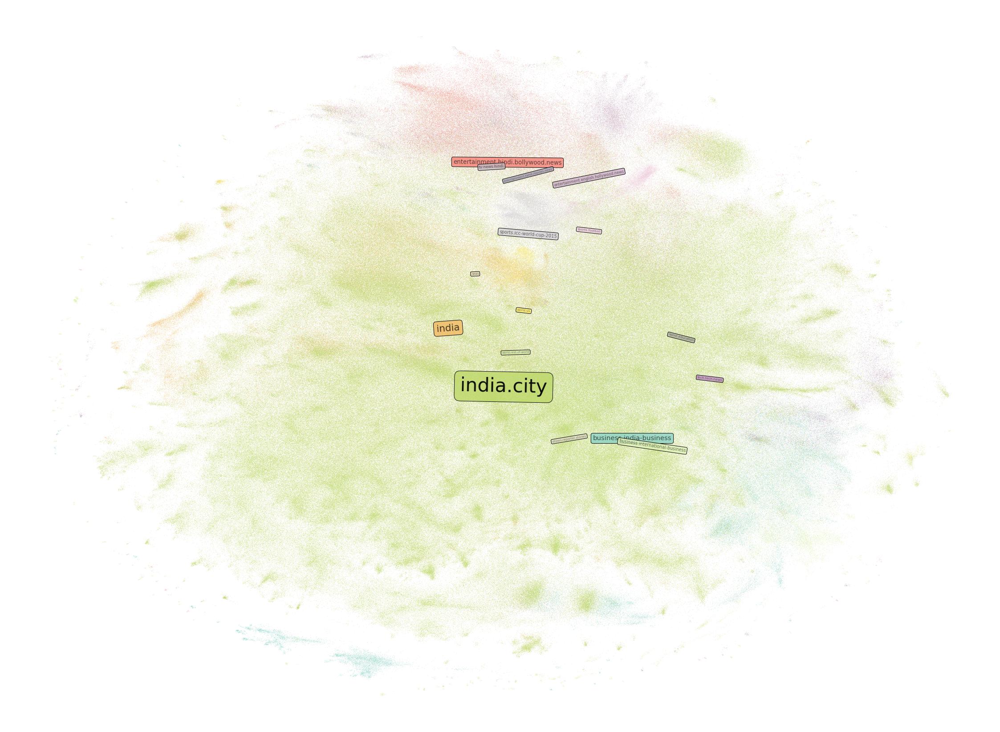

In [20]:
import matplotlib.pyplot as plt
import utils

fig, ax = plt.subplots(1, 1, figsize=(40, 30))
ax.set_axis_off()
utils.scatter_classes(Ys, y, ax, marker='.', s=0.05, alpha=0.8,
                      show_labels=False)


freq_dict = dict(df.headline_category.value_counts())
total = len(df.index)
weights = [freq_dict[names[k]]/total for k in np.unique(y)]
for k in np.unique(y):
    mean = np.mean(Ys[y == k], axis=0)
    ax.text(mean[0], mean[1], names[k], horizontalalignment='center', verticalalignment='center', 
            fontsize=50*weights[k]**0.4, alpha=weights[k]**0.15, stretch='condensed', 
            rotation=np.random.uniform(-1, 1)*15, bbox=dict(boxstyle="round",
                   ec=(0., 0., 0.),
                   fc=ax.collections[k].get_facecolor().squeeze(),
                   )
         )

plt.show()

In [21]:
fig.savefig(os.path.join(img_dir, "news_2kk.jpg"))

## Search for Patterns

Now we can look for dense areas in order to find similar news. Moreover, this can provide better category selection for each article's heading. But, first of all, we need to construct nearest neighbors lookup table. Luckily, for small dimensions it can be built in reasonable time even for large numbers of points.

In [80]:
vec_path = os.path.join(data_dir, "news_vectors")
df = pd.read_pickle(vec_path)

emb_path = os.path.join(data_dir, "news_emb")
Ys = np.load(emb_path+".npy")

In [81]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
nbrs = NearestNeighbors(n_neighbors=100).fit(Ys)

In [82]:
def draw_cloud(ax, p, offset, img_width, aspect, width=400):
    height = int(width/aspect)
    xs = np.linspace(-width/2, width/2, num=width)
    ys = np.linspace(-height/2, height/2, num=height)
    X, Y = np.meshgrid(xs, ys)
    X = X.ravel()
    Y = Y.ravel()
    Z = (X**2+(Y*aspect)**2) < (width/2)**2
    Z = np.reshape(Z, (height, width))
    Z = np.where(Z, 0, 255)

    
    x = x_min + p[0]*x_len
    y = y_min + p[1]*y_len
    ax.scatter(x, y, s=3000, alpha=0.8, c='orange', zorder=2)
    indices = nbrs.kneighbors(np.array([[x, y]]),
                              return_distance=False).ravel()
    text = ""
    for i in indices:
        text += " " + df.headline_text[i]
    
    wordcloud = WordCloud(background_color="white",mask = Z,
                         color_func=lambda *args, **kwargs: "darkorange",
                     ).generate(text)
    
    cloud_width = img_width*x_len
    cloud_height = cloud_width/aspect
    cloud_origin = (x+offset[0]*x_len, y+offset[1]*y_len)
    ax.imshow(wordcloud, extent=(cloud_origin[0]-cloud_width/2, 
                                 cloud_origin[0]+cloud_width/2, 
                                 cloud_origin[1]-cloud_height/2, 
                                 cloud_origin[1]+cloud_height/2),
              aspect="equal", alpha=1, zorder=1)

*WordCloud* will allow us to display most frequent words in the selected area.

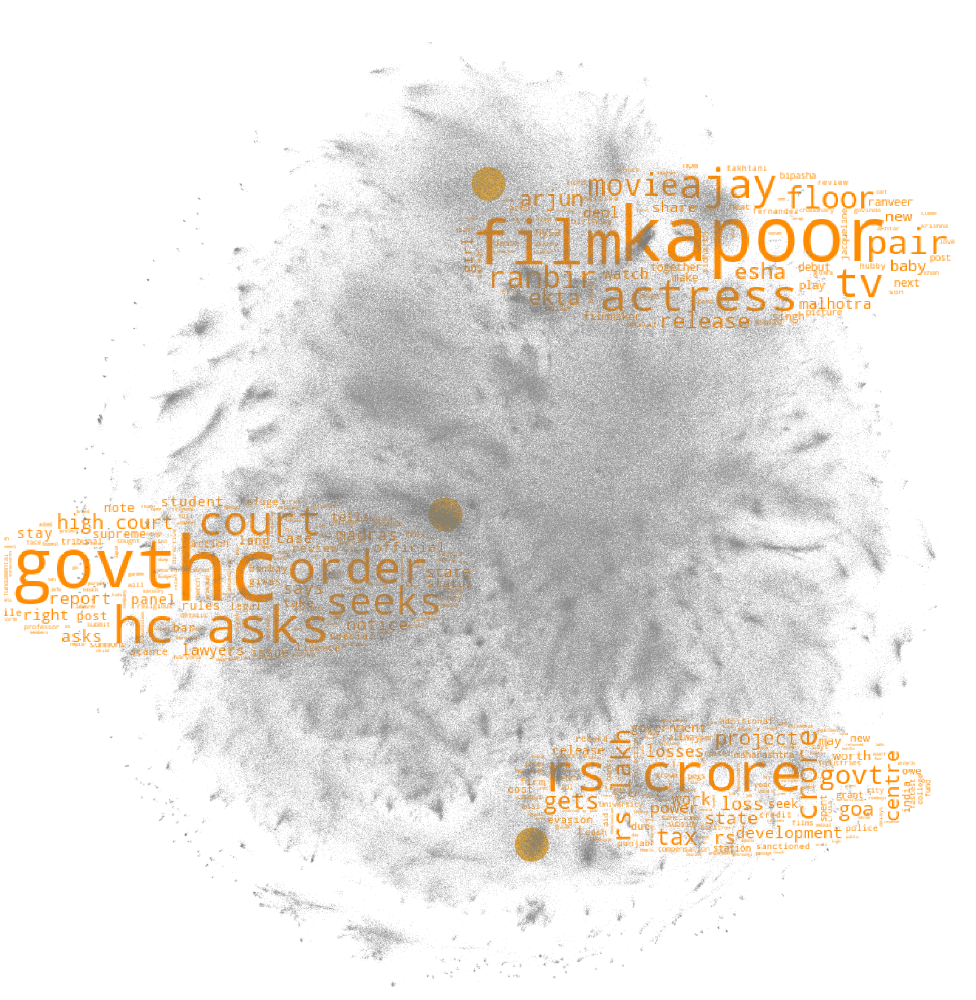

In [100]:
import matplotlib.pyplot as plt
import utils
from wordcloud import WordCloud

x_min, x_max = Ys[:, 0].min(), Ys[:, 0].max()
y_min, y_max = Ys[:, 1].min(), Ys[:, 1].max()
x_len = x_max - x_min 
y_len = y_max - y_min

fig, ax = plt.subplots(1, 1, figsize=(40, 30), frameon=False)
ax.set_axis_off()
ax.scatter(Ys[:, 0], Ys[:, 1], marker='o', s=0.05, alpha=0.4, 
           c='gray', zorder=3)

# Cinema
draw_cloud(ax, (0.48, 0.85), (0.25, -0.07), 0.6, 3)
# Courts
draw_cloud(ax, (0.43, 0.5), (-0.26, -0.07), 0.6, 3)
# Money
draw_cloud(ax, (0.53, 0.15), (0.22, 0.06), 0.5, 3)

ax.set_xlim(x_min-0.08*x_len, x_max+0.04*x_len)
ax.set_ylim(y_min-0.01*y_len, y_max+0.04*y_len)

plt.show()

In [101]:
fig.savefig(os.path.join(img_dir, "teaser.jpg"),bbox_inches = 'tight',
    pad_inches = 0.05)

## Focus on Isolated Groups

Visualization allows to study well-separated clusters more carefully. Let's print headlines, corresponding to one of those areas. Again, we will need a nearest neighbors lookup table.

In [146]:
vec_path = os.path.join(data_dir, "news_vectors")
df = pd.read_pickle(vec_path)

emb_path = os.path.join(data_dir, "news_emb")
Ys = np.load(emb_path+".npy")

In [147]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
nbrs = NearestNeighbors(n_neighbors=7).fit(Ys)

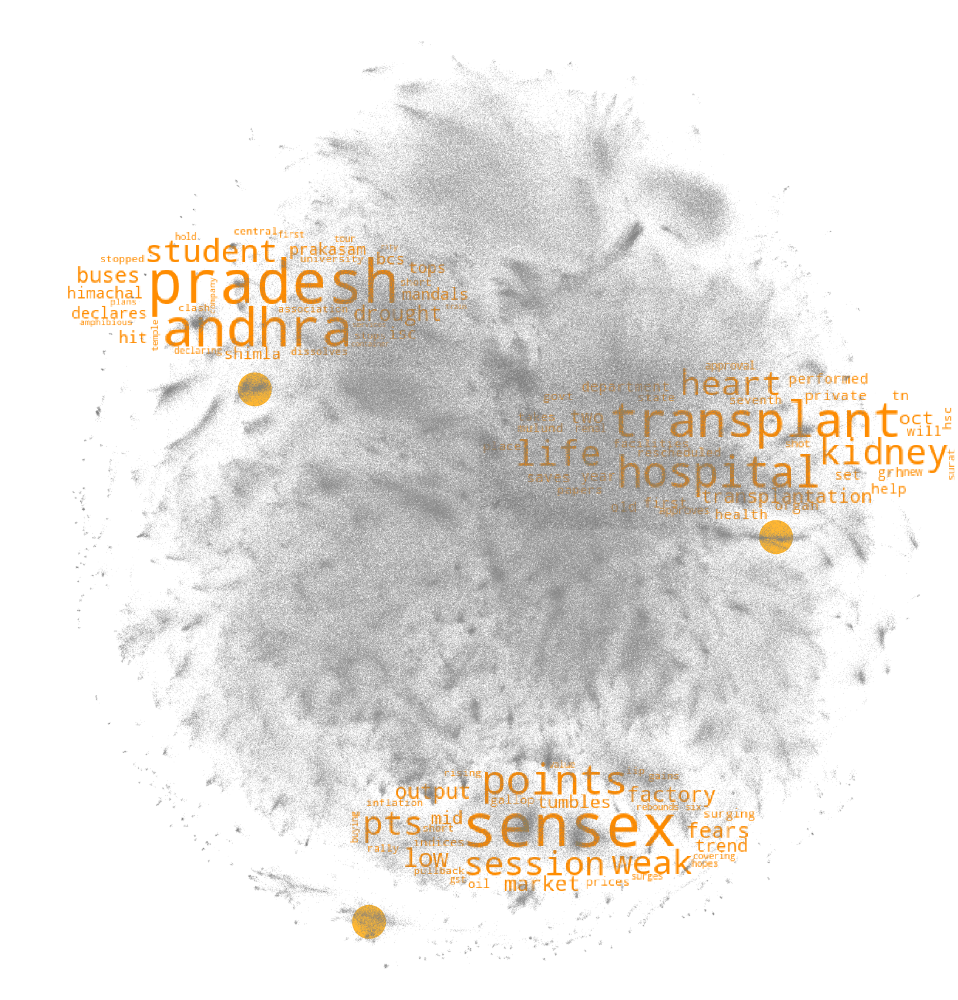

In [148]:
import matplotlib.pyplot as plt
import utils
from wordcloud import WordCloud

x_min, x_max = Ys[:, 0].min(), Ys[:, 0].max()
y_min, y_max = Ys[:, 1].min(), Ys[:, 1].max()
x_len = x_max - x_min 
y_len = y_max - y_min

fig, ax = plt.subplots(1, 1, figsize=(40, 30), frameon=False)
ax.set_axis_off()
ax.scatter(Ys[:, 0], Ys[:, 1], marker='o', s=0.05, alpha=0.4, 
           c='gray', zorder=3)

points = {"BSE SENSEX": [(0.35, 0.05), (0.22, 0.1), 0.5, 3],
          "Health": [(0.83, 0.465), (-0.05, 0.1), 0.6, 3],
          "Pradesh": [(0.215, 0.625), (0.01, 0.1), 0.5, 3]
         }

for name in points:
    draw_cloud(ax, *points[name])

ax.set_xlim(x_min-0.08*x_len, x_max+0.04*x_len)
ax.set_ylim(y_min-0.03*y_len, y_max+0.04*y_len)


plt.show()

In [149]:
for name in points:
    p = points[name][0]
    x = x_min + p[0]*x_len
    y = y_min + p[1]*y_len
    indices = nbrs.kneighbors(np.array([[x, y]]),
                              return_distance=False).ravel()
    print("Category:", name)
    for i in indices:
        print("\"" + df.headline_text[i] + "\"")
    print()

Category: BSE SENSEX
"sensex down pts on low factory output fears weak market trend"
"sensex tumbles points at mid session on surging oil prices"
"indices gallop in pullback rally"
"sensex down on weak iip rising inflation"
"sensex gains points on short covering"
"in just six sessions sensex surges points"
"sensex rebounds pts on value buying gst hopes"

Category: Health
"kidney transplant saves life of year old"
"south tn s first ever heart transplant performed in grh"
"health department will help private hospitals to set up organ transplantation facilities"
"seventh heart transplant takes place in mulund hospital"
"two hsc papers of oct rescheduled to oct"
"state govt approves renal transplantation approval for surat hospital"
"two get new shot at life after kidney transplants"

Category: Pradesh
"andhra pradesh declares mandals in prakasam drought hit"
"bcs student tops isc in shimla"
"himachal pradesh university dissolves student central association after students clash again"
"bus

In [150]:
fig.savefig(os.path.join(img_dir, "isolated.jpg"),bbox_inches = 'tight',
    pad_inches = 0.05)

# Performance Comparison

## Time Dependence on Number of Samples

Let's subsample the initial dataset and compare the times required to build its representation with various methods. We will compete with:
 - [Umap](https://github.com/lmcinnes/umap)
 - [Multicore t-SNE](https://github.com/DmitryUlyanov/Multicore-TSNE)
 - [t-SNE](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)
 - [NCVis](https://github.com/alartum/ncvis)

In [132]:
vec_path = os.path.join(data_dir, "news_vectors")
df = pd.read_pickle(vec_path)
X = np.stack(df.vector.values)

In [131]:
from sklearn.manifold import TSNE
from umap import UMAP
from MulticoreTSNE import MulticoreTSNE
from ncvis import NCVis

methods = {'t-SNE': TSNE(),
           'Multicore t-SNE': MulticoreTSNE(n_jobs=12),
           'Umap': UMAP(),
           'NCVis': NCVis()}
n_samples = [1000*2**k for k in range(11)]
print(n_samples)

[1000, 2000, 4000, 8000, 16000, 32000, 64000, 128000, 256000, 512000, 1024000]


In order to save time, we will stop benchmarking a method after the first time it took more than **stop_time** seconds to visualize dataset.

In [133]:
stop_time = 600

In [134]:
%%capture --no-stdout
# Umap tends to give warnings

import time
bm = pd.DataFrame()

is_fast = {'t-SNE': True,
           'Multicore t-SNE': True,
           'Umap': True,
           'NCVis': True}
for m in methods:
    for n in n_samples:
        if not is_fast[m]:
            break
        print(m, n)
        row = {'n_samples': n,
               'method': m}
        start = time.time()
        methods[m].fit_transform(X[:n])
        stop = time.time()
        total = stop-start
        row['time'] = total
        bm = bm.append(row, ignore_index=True, sort=False)
        if total > stop_time:
            is_fast[m] = False
bm.method = bm.method.astype("category")

t-SNE 1000
t-SNE 2000
t-SNE 4000
t-SNE 8000
t-SNE 16000
t-SNE 32000
Multicore t-SNE 1000
Multicore t-SNE 2000
Multicore t-SNE 4000
Multicore t-SNE 8000
Multicore t-SNE 16000
Multicore t-SNE 32000
Multicore t-SNE 64000
Multicore t-SNE 128000
Umap 1000
Umap 2000
Umap 4000
Umap 8000
Umap 16000
Umap 32000
Umap 64000
Umap 128000
Umap 256000
Umap 512000
NCVis 1000
NCVis 2000
NCVis 4000
NCVis 8000
NCVis 16000
NCVis 32000
NCVis 64000
NCVis 128000
NCVis 256000
NCVis 512000
NCVis 1024000


In [12]:
bm_path = os.path.join(data_dir, "benchmark.csv")
try:
    bm = pd.read_csv(bm_path)
    bm.method = bm.method.astype("category")
except:
    bm.method = bm.method.astype("category")
    bm.to_csv(bm_path)
bm.head()

,Unnamed: 0,method,n_samples,time
0,0,t-SNE,1000.0,5.071567
1,1,t-SNE,2000.0,14.646541
2,2,t-SNE,4000.0,30.496009
3,3,t-SNE,8000.0,96.225557
4,4,t-SNE,16000.0,255.468995


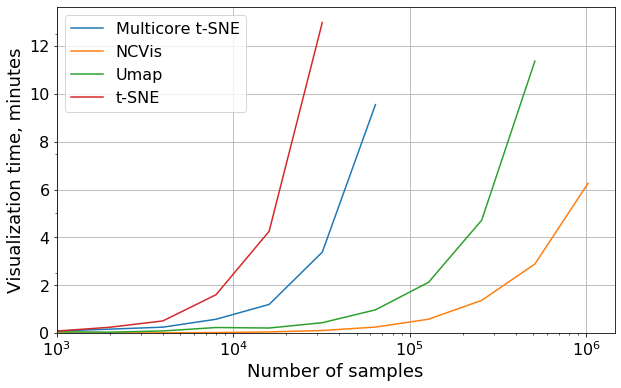

In [13]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

fig, ax = plt.subplots(1, 1, figsize=(10, 6))

ax.set_xlabel('Number of samples', fontsize=18)
ax.set_xscale('log')
ax.set_ylabel('Visualization time, minutes', fontsize=18)

for m in bm.method.cat.categories:
    df_m = bm[bm.method == m]
    n_samples = df_m.n_samples.values
    times     = df_m.time.values/60
    mask = times < 15
    ax.plot(n_samples[mask], times[mask], label=m)

ax.set_ylim(0)
ax.set_xlim(1000)
# ax.set_yticks(np.arange(10, dtype=int))
ax.yaxis.set_minor_locator(MultipleLocator(5))
ax.yaxis.set_major_formatter(FormatStrFormatter('%d'))
ax.yaxis.set_minor_locator(MultipleLocator(2.5))
ax.tick_params(axis = 'both', which = 'major', labelsize = 16)
ax.grid()
ax.legend(prop={'size':16})
plt.show()

In [154]:
fig.savefig(os.path.join(img_dir, "time.pdf"))

## Quality on Standard Datasets

Consider the [PenDigits Dataset](https://archive.ics.uci.edu/ml/datasets/optical+recognition+of+handwritten+digits) for quality evaluation. It has well-defined cluster structure, where each cluster corresponds to images of specific digit. We assume that all methods will succed in capturing this structure.

In [339]:
from sklearn.manifold import TSNE
from umap import UMAP
from MulticoreTSNE import MulticoreTSNE
from ncvis import NCVis
import data
import utils

methods = {'t-SNE': TSNE(),
           'Multicore t-SNE': MulticoreTSNE(n_jobs=12),
           'Umap': UMAP(),
           'NCVis': NCVis()}

In [ ]:
!bash data/download.sh pendigits

In [344]:
ds = data.PenDigits()
Ys = {}
print("Number of samples:", len(ds))

Number of samples: 5620


In [351]:
%%capture --no-stdout
# Umap tends to give warnings

import time

# Compare with baseline
bl = pd.DataFrame()

for m in methods:
    print(m)
    row = {"method": m}
    start = time.time()
    Ys[m] = methods[m].fit_transform(ds.X)
    stop = time.time()
    total = stop-start
    row["time"] = total
    bl = bl.append(row, ignore_index=True, sort=False)
bl.method = bl.method.astype("category")

t-SNE
Multicore t-SNE
Umap
NCVis


In [107]:
bl_path = os.path.join(data_dir, "baseline.csv")
try:
    bl = pd.read_csv(bl_path)
except:
    bl.to_csv(bl_path)

In [108]:
bl

,Unnamed: 0,method,time
0,0,t-SNE,29.504467
1,1,Multicore t-SNE,14.302933
2,2,Umap,7.528847
3,3,NCVis,0.912293


In [360]:
for name, Y in Ys.items():
    print(name)
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    ax.set_axis_off()
    utils.scatter_classes(Y, ds.y, ax, marker='.', s=20, alpha=0.8,
                          show_labels=False)
    plt.tight_layout()
    fig.savefig(os.path.join(img_dir, name+".pdf"))
    plt.close()

t-SNE
Multicore t-SNE
Umap
NCVis


## Methods without Convenient Installers

There are also alternative methods among those without convenient Python wrappers. Let's check if they can outperform NCVis. We will consider:
- [FIt-SNE](https://github.com/KlugerLab/FIt-SNE)
- [LargeVis](https://github.com/lferry007/LargeVis)

In [89]:
vec_path = os.path.join(data_dir, "news_vectors")
df = pd.read_pickle(vec_path)
X = np.stack(df.vector.values)

### Building FIt-SNE

In [12]:
%%bash
cd big-data
[ -e FIt-SNE ] && rm -rf FIt-SNE
git clone https://github.com/KlugerLab/FIt-SNE.git
conda install -c conda-forge -y -q fftw
cd FIt-SNE
g++ -std=c++11 -O3 -I$CONDA_PREFIX/include -L$CONDA_PREFIX/lib src/sptree.cpp src/tsne.cpp src/nbodyfft.cpp $CONDA_PREFIX/lib/libfftw3.a -o bin/fast_tsne -pthread -lm

Solving environment: ...working... done

# All requested packages already installed.



Cloning into 'FIt-SNE'...


In [13]:
import sys; sys.path.append(os.path.join(os.getcwd(),
                                         data_dir,
                                         'FIt-SNE'))
from fast_tsne import fast_tsne

In [14]:
Ys = fast_tsne(X[:1000, :], nthreads=12)

/home/alartum/jupyter/ncvis-examples/big-data/FIt-SNE/bin/fast_tsne 1.1.0 data.dat result.dat 12


### Building LargeVis

In [57]:
%%bash
cd big-data
[ -e LargeVis ] && rm -rf LargeVis
git clone https://github.com/lferry007/LargeVis.git
conda install -c conda-forge -q -y gsl
cd LargeVis/Linux
g++ -I$CONDA_PREFIX/include -L$CONDA_PREFIX/lib LargeVis.cpp main.cpp $CONDA_PREFIX/lib/libgsl.a $CONDA_PREFIX/lib/libgslcblas.a -o LargeVis -lm -pthread -Ofast -march=native -ffast-math

Solving environment: ...working... done

# All requested packages already installed.



Cloning into 'LargeVis'...


In [14]:
import subprocess
def LargeVis(X, n_threads=1, samples=None):
    in_file = os.path.join(data_dir, 'lv.in')
    out_file = os.path.join(data_dir, 'lv.out')
    np.savetxt(in_file, X, fmt='%.4f', comments='',
               header='{} {}'.format(X.shape[0], X.shape[1]))
    largevis_path = os.path.join(data_dir,
                                'LargeVis',
                                'Linux')
    opt = [os.path.join(largevis_path, 'LargeVis'),
                     "-input", in_file,
                     "-output", out_file,
                     "-threads", str(n_threads)]
    if samples is not None:
        opt.extend(["-samples", str(samples)])
    subprocess.call(opt)
    return np.loadtxt(out_file, skiprows=1)

### Timing

We will use the same timing procedure as above.

In [146]:
vec_path = os.path.join(data_dir, "news_vectors")
df = pd.read_pickle(vec_path)
X = np.stack(df.vector.values)

In [147]:
methods = {'FIt-SNE': fast_tsne,
           'LargeVis': lambda x: LargeVis(x, n_threads=12, 
                                          samples=x.shape[0]*10**4/10**6)
          }
n_samples = [1000*2**k for k in range(11)]
print(n_samples)

[1000, 2000, 4000, 8000, 16000, 32000, 64000, 128000, 256000, 512000, 1024000]


In order to save time, we will stop benchmarking a method after the first time it took more than **stop_time** seconds to visualize dataset.

In [148]:
stop_time = 600

In [ ]:
%%capture --no-stdout
# Umap tends to give warnings

import time
bm = pd.DataFrame()

is_fast = {name : True for name in methods}
for m in methods:
    for n in n_samples:
        if not is_fast[m]:
            break
        print(m, n)
        row = {'n_samples': n,
               'method': m}
        start = time.time()
        methods[m](X[:n])
        stop = time.time()
        total = stop-start
        row['time'] = total
        bm = bm.append(row, ignore_index=True, sort=False)
        if total > stop_time:
            is_fast[m] = False
bm.method = bm.method.astype("category")

In [3]:
bm_path = os.path.join(data_dir, "benchmark_add.csv")
try:
    bm = pd.read_csv(bm_path)
    bm.method = bm.method.astype("category")
except:
    bm.method = bm.method.astype("category")
    bm.to_csv(bm_path)

In [14]:
names = ["benchmark_add.csv", "benchmark.csv"]
bm_all = pd.DataFrame()
for df in [pd.read_csv(os.path.join(data_dir, x)) for x in names]:
    bm_all = bm_all.append(df, ignore_index=True, sort=False)
bm_all.method = bm_all.method.astype("category")
try:
    bm_all = bm_all.drop(columns=["Unnamed: 0"])
except:
    pass

bm_all.head()

,method,n_samples,time
0,FIt-SNE,1000.0,15.146218
1,FIt-SNE,2000.0,12.635471
2,FIt-SNE,4000.0,12.803489
3,FIt-SNE,8000.0,12.824447
4,FIt-SNE,16000.0,16.509187


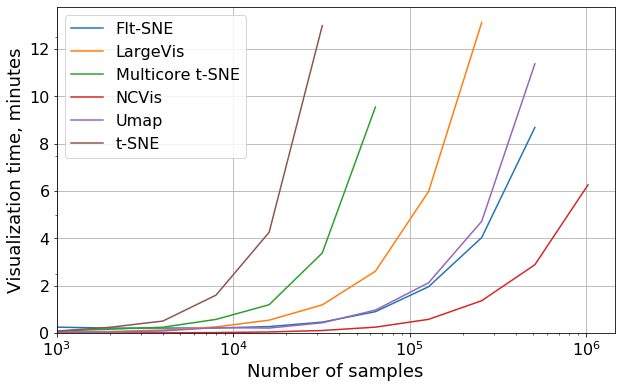

In [15]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

fig, ax = plt.subplots(1, 1, figsize=(10, 6))

ax.set_xlabel('Number of samples', fontsize=18)
ax.set_xscale('log')
ax.set_ylabel('Visualization time, minutes', fontsize=18)

for m in bm_all.method.cat.categories:
    df_m = bm_all[bm_all.method == m]
    n_samples = df_m.n_samples.values
    times     = df_m.time.values/60
    mask = times < 15
    ax.plot(n_samples[mask], times[mask], label=m)

ax.set_ylim(0)
ax.set_xlim(1000)
# ax.set_yticks(np.arange(10, dtype=int))
ax.yaxis.set_minor_locator(MultipleLocator(5))
ax.yaxis.set_major_formatter(FormatStrFormatter('%d'))
ax.yaxis.set_minor_locator(MultipleLocator(2.5))
ax.tick_params(axis = 'both', which = 'major', labelsize = 16)
ax.grid()
ax.legend(prop={'size':16})
plt.show()

In [161]:
fig.savefig(os.path.join(img_dir, "time_all.pdf"))

### Quality

In [19]:
import data
import utils

methods = {'FIt-SNE': fast_tsne,
           'LargeVis': lambda x: LargeVis(x, n_threads=12, 
                                          samples=x.shape[0]*10**4/10**6)
          }

In [ ]:
!bash data/download.sh pendigits

In [21]:
ds = data.PenDigits()
Ys = {}
print("Number of samples:", len(ds))

Number of samples: 5620


In [ ]:
%%capture --no-stdout
# Umap tends to give warnings

import time

# Compare with baseline
bl = pd.DataFrame()

for m in methods:
    print(m)
    row = {"method": m}
    start = time.time()
    Ys[m] = methods[m](ds.X)
    stop = time.time()
    total = stop-start
    row["time"] = total
    bl = bl.append(row, ignore_index=True, sort=False)
bl.method = bl.method.astype("category")

In [24]:
bl_path = os.path.join(data_dir, "baseline_add.csv")
try:
    bl = pd.read_csv(bl_path)
    bl.method = bl.method.astype("category") 
except:
    bl.method = bl.method.astype("category")
    bl.to_csv(bl_path)
bl.head()

,Unnamed: 0,method,time
0,0,FIt-SNE,17.431626
1,1,LargeVis,9.665409


In [25]:
for name, Y in Ys.items():
    print(name)
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    ax.set_axis_off()
    utils.scatter_classes(Y, ds.y, ax, marker='.', s=20, alpha=0.8,
                          show_labels=False)
    plt.tight_layout()
    fig.savefig(os.path.join(img_dir, name+".pdf"))
    plt.close()

FIt-SNE
LargeVis


## Parallelization Efficiency

For those methods which allow parallel execution, we can measure the effectiveness of doing so. Among this methods are:
- [Multicore t-SNE](https://github.com/DmitryUlyanov/Multicore-TSNE)
- [FIt-SNE](https://github.com/KlugerLab/FIt-SNE)
- [LargeVis](https://github.com/lferry007/LargeVis)
- [NCVis](https://github.com/alartum/ncvis)

In [10]:
vec_path = os.path.join(data_dir, "news_vectors")
df = pd.read_pickle(vec_path)
X = np.stack(df.vector.values)

In [11]:
from MulticoreTSNE import MulticoreTSNE
from ncvis import NCVis
import data
import utils

n_samples = 10000
methods = {'Multicore t-SNE': 
               lambda x, n: MulticoreTSNE(n_jobs=n).fit_transform(x),
           'NCVis': 
               lambda x, n: NCVis(n_threads=n).fit_transform(x),
           'FIt-SNE': 
               lambda x, n: fast_tsne(x, nthreads=n),
           'LargeVis': 
               lambda x, n: LargeVis(x, n_threads=n, samples=x.shape[0]*10**4/10**6)
          }

In [ ]:
import time
eff = pd.DataFrame()

for m in methods:
    for n in [1, 4, 7, 10, 12]:
        print(m, n)
        row = {'n_threads': n,
               'method': m}
        start = time.time()
        methods[m](X[:n_samples, :], n)
        stop = time.time()
        total = stop-start
        row['time'] = total
        eff = eff.append(row, ignore_index=True, sort=False)
        
eff.method = eff.method.astype("category")

In [16]:
eff_path = os.path.join(data_dir, "efficiency.csv")
eff.method = eff.method.astype("category")
eff.to_csv(eff_path)

In [18]:
eff_path = os.path.join(data_dir, "efficiency.csv")
try:
    eff = pd.read_csv(eff_path)
    eff.method = eff.method.astype("category")
except:
    eff.method = eff.method.astype("category")
    eff.to_csv(eff_path)
try:
    eff = eff.drop(columns=["Unnamed: 0"])
except:
    pass
eff.head()

,method,n_threads,time
0,Multicore t-SNE,1.0,76.992673
1,Multicore t-SNE,4.0,34.949450
2,Multicore t-SNE,7.0,46.890453
3,Multicore t-SNE,10.0,43.932928
4,Multicore t-SNE,12.0,44.343827


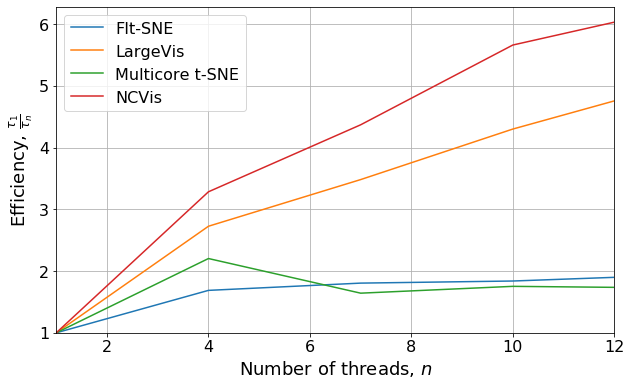

In [20]:
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

fig, ax = plt.subplots(1, 1, figsize=(10, 6))

ax.set_ylabel(r'Efficiency, $\frac{\tau_1}{\tau_n}$', fontsize=18)
ax.set_xlabel(r'Number of threads, $n$', fontsize=18)

for m in eff.method.cat.categories:
    df_m = eff[eff.method == m]
    n_threads = df_m.n_threads.values
    time_1 = df_m.time[df_m.n_threads == 1].values.item()
    effs   = time_1/df_m.time.values
    ax.plot(n_threads, effs, label=m)

ax.set_ylim(1)
ax.set_xlim(1, 12)

# ax.yaxis.set_minor_locator(MultipleLocator(5))
# ax.yaxis.set_major_formatter(FormatStrFormatter('%d'))
# ax.yaxis.set_minor_locator(MultipleLocator(2.5))
ax.tick_params(axis = 'both', which = 'major', labelsize = 16)
ax.grid()
ax.legend(prop={'size':16})
plt.show()

In [21]:
fig.savefig(os.path.join(img_dir, "efficiency.pdf"))